# LMUNet: Landscape metrics unet

**ORIGINAL SOURCE:** [Top 100 solution - SIIM-ACR Pneumothorax Segmentation](https://amaarora.github.io/2020/09/06/siimacr.html#train-and-valid-augmentations)

The Data-structure should look like this (old names: 

```
├── data
│   ├── dataset512
│   ├── dicom-images-test
│   └── dicom-images-train
└── src
    └── pneumothorax-segmentation 
```


## Preparations

### Imports

In [1]:
import os
import torch
import numpy as np
import pandas as pd
#import cv2
from pathlib import Path

from tqdm import tqdm


#import matplotlib.pyplot as plt
#import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
#from torch.nn import MSELoss
from torcheval.metrics import MeanSquaredError, R2Score
#from collections import defaultdict
#import torchvision

#import torch.nn.functional as F
#from sklearn.model_selection import StratifiedKFold

# dataset and unet (could also add to this file, hmm!
from Dataset_test_many_metrics import LandscapeMetricsDataset
from unet_num_metr import unet #, Decoder

from LMUnet_visualization_functions import visualize

# Import custom loss functions
from LMUnet_custom_loss_functions import MSELossNan, HuberLossNan

block_test torch.Size([1, 64, 128, 128])
encoder_test torch.Size([1, 64, 128, 128])
encoder_test torch.Size([1, 128, 64, 64])
encoder_test torch.Size([1, 256, 32, 32])
encoder_test torch.Size([1, 512, 16, 16])
decoder_test torch.Size([1, 64, 64, 64])
unet_output_dim_test torch.Size([1, 1, 128, 128])


### Config (Hyperparameters)

In [32]:
# Set directories of training data
DATA_DIR         = Path(f'../notebooks/data')

# Directory of training, validation and testing landscapes
TRAIN_IMG_DIR    = DATA_DIR/'100k_landscapes_5_class'

# Annotation table for the data
TRAIN_DF         = pd.read_csv('data/100k_joinent_5_class_metric_list.csv', 
                               header=None)

# Load list for which channel carries which metric
metr_norm        = pd.read_csv('metr_norm.csv', header=None).values.tolist()

# Input and output directory names
TRAIN_METRIC     = f'100k_5cl_multi_metrics_66'
TRAIN_LBL_DIR    = DATA_DIR/TRAIN_METRIC # 100k 5 class
OUTPUT_DIR       = Path(f'outputs/saved_models/{TRAIN_METRIC}_testing')
TRAIN_LOG        = OUTPUT_DIR/'output_log.txt'

print(TRAIN_LBL_DIR)
print(OUTPUT_DIR)

../notebooks/data/100k_5cl_multi_metrics_66
outputs/saved_models/100k_5cl_multi_metrics_66_testing


In [3]:
# Decide whether to train the model or test (a pretrained) one
TRAIN_MODEL      = True
EVALUATE         = True

PRETRAINED       = False
TEST_MODEL       = False

In [4]:
# Load a pretrained model for further training or testing purposes
if TEST_MODEL or PRETRAINED:
    #PRETRAINED_DIR   = Path(f'../notebooks/outputs/saved_models')
    #PRETRAINED_PATH  = 'PRETRAINED_DIR/100k_frac_mn_5_class_metr/bst_model128_fold8_0.9017.bin'
    PRETRAINED_PATH  = 'outputs/saved_models/100k_5cl_multi_metrics_66_pad_zeroes/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:50_0.9537_lr:2.0e-05.bin'
    #PRETRAINED_PATH  = 'outputs/saved_models/100k_5cl_multi_metrics_66_pad_zeroes/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:13_0.8937_lr:2.0e-05.bin'

In [5]:
# Configurations for the model
IMG_SIZE         = 128
DATASET_LENGHTS  = [80000,15000,5000] # example split for 100k
BATCH_SIZE       = 16
TEST_BATCH_SIZE  = BATCH_SIZE
TRAIN_BATCH_SIZE = BATCH_SIZE
VALID_BATCH_SIZE = BATCH_SIZE
DEVICE           = 'cuda'
LEARNING_RATE    = 2e-5
EPOCHS           = 100
LOSS_FN          = 'HL_NAN' #'HL' # HuberLoss ['MSE','RMSE','MAE'
EVAL_FN          = 'R2' # ['MSE']
USE_CRIT         = True
NUM_WORKERS      = 0 # was 12, but much stronger with 0; also try 4 (GS?)
#NUM_METRICS      = 1 # automaticalyl detect channel amount later on

## Dataset

### Dataset

In [6]:
# Load mean and standard deviation data for normalisation
mean_std = 'mean_std.csv'
mean_std = pd.read_csv(mean_std, header=None)
mean_std = {mean_std.iloc[row][0]:[mean_std.iloc[row][1], mean_std.iloc[row][2]] for row in range(len(mean_std))}

In [7]:
# Create dataset based on current preferences

# Default
full_dataset = LandscapeMetricsDataset(TRAIN_DF, TRAIN_IMG_DIR, TRAIN_LBL_DIR, 
                                       metr_norm=metr_norm, mean_std=mean_std)

# Add noise
#full_dataset = LandscapeMetricsDataset(TRAIN_DF, TRAIN_IMG_DIR, TRAIN_LBL_DIR, 
#                                       metr_norm=metr_norm, mean_std=mean_std, 
#                                       add_noise=True)

# Normalize the input landscapes
#full_dataset = LandscapeMetricsDataset(TRAIN_DF, TRAIN_IMG_DIR, TRAIN_LBL_DIR, 
#                                       metr_norm=metr_norm, mean_std=mean_std, 
#                                       ls_norm=True)

len(full_dataset)

100000

In [8]:
# Split the dataset by the set DATASET_LENGHTS (i.e. 80k, 15k, 5k)
train_dataset, val_dataset, test_dataset = random_split(dataset=full_dataset, 
                                                        lengths=DATASET_LENGHTS,
                                                        generator=torch.Generator().manual_seed(42))

print(len(train_dataset), len(val_dataset), len(test_dataset))

80000 15000 5000


In [9]:
# Sanity check
landscape, metric = train_dataset[136]['landscape'], train_dataset[136]['metric']

# Shape should be (torch.Size([1, 128, 128]), torch.Size([57, 128, 128]))
landscape.shape, metric.shape

(torch.Size([1, 128, 128]), torch.Size([57, 128, 128]))

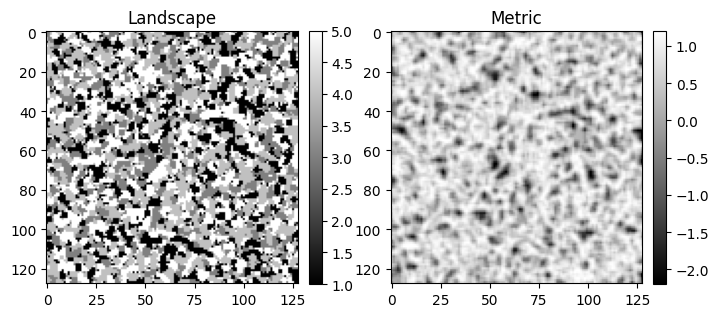

In [10]:
# Plot one with mask 
visualize(train_dataset[5]['landscape'].squeeze(), train_dataset[5]['metric'][51].squeeze())

### DataLoaders

In [11]:
# Prepare train and validation dataloaders
train_dataloader = DataLoader(train_dataset, TRAIN_BATCH_SIZE, 
                              shuffle=True, num_workers=NUM_WORKERS)
val_dataloader   = DataLoader(val_dataset, VALID_BATCH_SIZE, 
                              shuffle=False, num_workers=NUM_WORKERS)

In [12]:
# Sanity check
landscapes, metrics = next(iter(train_dataloader))['landscape'], next(iter(train_dataloader))['metric']
landscapes.shape, metrics.shape
# Should look like this: (torch.Size([16, 1, 128, 128]), torch.Size([16, 57, 128, 128]))

(torch.Size([16, 1, 128, 128]), torch.Size([16, 57, 128, 128]))

## Model and Training

### Loss

In [13]:
# Decide on loss function
LOSS_FN = 'HL_NAN'

if LOSS_FN == 'MAE':
    criterion = nn.L1Loss()

elif LOSS_FN == 'MSE' or LOSS_FN == 'RMSE':
    criterion = nn.MSELoss()  

elif LOSS_FN == 'HL':
    criterion = nn.HuberLoss()
    
elif LOSS_FN == 'HL_NAN':
    criterion = HuberLossNan()
    
elif LOSS_FN == 'MSE_NAN':
    criterion = MSELossNan()        

In [14]:
criterion

HuberLossNan()

### Model

In [31]:
#%run unet_resnet_ChatGPT.py

In [15]:
# How many metric channels there are. Default: 57
NUM_METRICS = metrics.shape[1] 

# Original approach U-Net
model = unet(num_metr=NUM_METRICS)

# ResU-Net according to ChatGPT and that paper
#model = ResUNet(num_metr=NUM_METRICS)

#model = model.half()

In [ ]:
# Load pretrained model
if PRETRAINED: 
    model.load_state_dict(torch.load(PRETRAINED_PATH))

### Early Stopping

In [19]:
class EarlyStopping:
    """Stop training if no more improvement.
    Save checkpoints if improvement.
    delta    -- how much improvement
    patience -- how many epochs
    mode     -- whether score is to increase or decrease
    """   
    def __init__(self, patience=7, mode="max", delta=0.0001):
        self.patience = patience
        self.counter = 0
        self.mode = mode
        self.best_score = None
        self.early_stop = False
        self.delta = delta
        if self.mode == "min":
            self.val_score = np.Inf
        else:
            self.val_score = -np.Inf

    def __call__(self, epoch_score, model, model_path):
        """Call the early stopping class"""
        if self.mode == "min":
            score = -1.0 * epoch_score
        else:
            score = np.copy(epoch_score)

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(epoch_score, model, model_path)
        
        elif score > self.best_score - self.delta:

            self.counter += 1
            print(
                "EarlyStopping counter: {} out of {}".format(
                    self.counter, self.patience
                )
            )
            if self.counter >= self.patience:
                self.early_stop = True
                #self.counter = 0
            
        else:
            self.best_score = score
            self.save_checkpoint(epoch_score, model, model_path)
            self.counter = 0

    def save_checkpoint(self, epoch_score, model, model_path):
        """Save the model if score improves"""
        model_path = Path(model_path)
        parent = model_path.parent
        os.makedirs(parent, exist_ok=True)
        if epoch_score not in [-np.inf, np.inf, -np.nan, np.nan]:
            print(
                "Validation score improved ({} --> {}). Model saved at {}!".format(
                    self.val_score, epoch_score, model_path
                )
            )
            torch.save(model.state_dict(), model_path)
        self.val_score = epoch_score

### Averagemeter

In [20]:
class AverageMeter:
    """Save average of loss score"""
    def __init__(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

### Train one epoch

In [21]:
def train_one_epoch(train_loader, model, optimizer, loss_fn, accumulation_steps=1, device='cuda'):
    """Train the model for one epoch"""
    losses = AverageMeter()
    model = model.to(device)
    model.train()
    if accumulation_steps > 1: 
        optimizer.zero_grad()
    tk0 = tqdm(train_loader, total=len(train_loader))
    for b_idx, data in enumerate(tk0):
        for key, value in data.items():
            data[key] = value.to(device)
        if accumulation_steps == 1 and b_idx == 0:
            optimizer.zero_grad()
        out  = model(data['landscape'])
        loss = loss_fn(out, data['metric'])
        if LOSS_FN == 'RMSE':
            loss = torch.sqrt(loss)
        with torch.set_grad_enabled(True):
            loss.backward()
            if (b_idx + 1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
        losses.update(loss.item(), train_loader.batch_size)
        tk0.set_postfix(loss=losses.avg, learning_rate=optimizer.param_groups[0]['lr'])
    return losses.avg

### Evaluation Metric

In [25]:
if EVAL_FN == 'MSE':
    eval_metric = MeanSquaredError()    
    # Set mode 'min' when using MSE for validation in evalution functions
    eval_mode = 'min'
    
elif EVAL_FN == 'R2':
    eval_metric = R2Score()
    # Set mode 'max' when using MSE for validation in evalution functions
    eval_mode = 'max'

def evaluate(val_loader, model, device='cuda', criterion=eval_metric):
    """Computes the validation accuracy of the model on the validation set."""
   
    model = model.to(device)
    model.eval()
    tk0 = tqdm(val_loader, total=len(val_loader))

    with torch.no_grad():
        for b_idx, data in enumerate(tk0):
            for key, value in data.items():
                data[key] = value.to(device)
            
            # Predict output metrics
            out   = model(data['landscape'])  
                   
            # Assign target metrics
            targets = data['metric']
            
            # Masking NaNs
            nan_mask = torch.isnan(targets)
            valid_mask = ~nan_mask
            targets = targets[valid_mask]
            out = out[valid_mask]
            
            # Flatten outputs and targets
            targets_flat = targets.view(targets.shape[0], -1).cpu()
            outputs_flat = out.view(out.shape[0], -1).cpu()
            
            # Calculate evlaution score
            criterion.update(outputs_flat, targets_flat)            
            val_loss = criterion.compute().item()            
            tk0.set_postfix(val_score=val_loss)
            
        criterion.reset()

    return val_loss

### Optimizer and scheduler

In [33]:
optimizer = torch.optim.Adam(model.parameters(), lr= LEARNING_RATE)

In [34]:
# Reduce the learning rate if a Plaeteau is hit
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode=eval_mode, factor=0.7, patience=5, verbose=True)   

### o) Train model

In [35]:
# Initialize early stopping
es = EarlyStopping(patience=10, mode=eval_mode)

In [36]:
if TRAIN_MODEL:
    def save_best_hyperparam(text, path):
        """Function to save best hyperparameters to .csv file.
        text -- The hyperparameters dictionary.
        path -- Path to save the hyperparmeters.
        """
        with open(path, 'a') as f:  
            if os.stat(path).st_size == 0:
                f.write(f"{str(text.keys())[11:-2]}\n")

            f.write(f"{str(text.values())[13:-2]}\n")

In [37]:
if TRAIN_MODEL:
    
    # Directory to save the state dicts and log in
    os.mkdir(OUTPUT_DIR)
    
    # Iterate over epochs to train the model
    for epoch in range(EPOCHS):
        loss = train_one_epoch(train_dataloader, model, optimizer, criterion)
        eval_score = evaluate(val_dataloader, model, criterion=eval_metric)
        
        # Dictionary with all parameters to save 
        param_dict = {
            'METR NAME'   : TRAIN_METRIC,
            'EPOCH'       : epoch, 
            'TRAIN LOSS'  : np.round(loss, 4),
            'VAL SCORE'   : np.round(eval_score,4), 
            'LOSS FN'     : LOSS_FN, 
            'BATCH SZ'    : TRAIN_BATCH_SIZE,
            'NUM WORKERS' : NUM_WORKERS,
            'NUM METRICS' : NUM_METRICS,
            'LEARN RATE'  : "{:e}".format(optimizer.param_groups[0]['lr']),
        }
        
        # Early stopping and save to table
        param_string = f"{TRAIN_METRIC}_bs:{TRAIN_BATCH_SIZE}_nw:{NUM_WORKERS}_nm:{NUM_METRICS}_lf:{LOSS_FN}_ep:{str(epoch).rjust(2, '0')}_{np.round(eval_score,4)}_lr:{optimizer.param_groups[0]['lr']:.1e}"        # dubbel, maybe adjust somehow?
        print(f"EPOCH: {epoch}, TRAIN LOSS: {loss}, VAL SCORE: {eval_score}")
        es(eval_score, model, model_path=f"{OUTPUT_DIR}/bst_model_{param_string}.bin")
        save_best_hyperparam(param_dict, f"{OUTPUT_DIR}/best_param.csv")
        if es.early_stop:
            print('\n\n -------------- EARLY STOPPING -------------- \n\n')
            break
        
        # Scheduler step to see if LR should be reduced
        scheduler.step(eval_score)         
            
# Evaluate on test data after training 
if EVALUATE: 
    test_dataloader = DataLoader(test_dataset, TEST_BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    test_score = evaluate(test_dataloader, model, criterion=eval_metric)    

  1%|          | 48/5000 [00:19<32:52,  2.51it/s, learning_rate=2e-5, loss=0.416] 


KeyboardInterrupt: 

In [98]:
if EVALUATE: 
    print(f"Test evaluation R2 score: {test_score}")

NameError: name 'test_score' is not defined

## Testing

### p) Predict Test Landscapes (single-model)

In [60]:
TEST_MODEL = True

In [61]:
if TEST_MODEL:
    test_dataloader = DataLoader(test_dataset, TEST_BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

In [57]:
# Load state dict
if TEST_MODEL:
    PRETRAINED_PATH = 'outputs/saved_models/100k_5cl_multi_metrics_66_adjusted/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:34_0.9707_lr:8.1e-07.bin'
    best_model_path = PRETRAINED_PATH    
    model.load_state_dict(torch.load(best_model_path))

In [58]:
if TEST_MODEL:
    model = model.to('cuda')

In [ ]:
# Test data evaluation score
if TEST_MODEL:
    test_score = evaluate(test_dataloader, model, criterion=eval_metric)

In [63]:
if TEST_MODEL:
    def predict(test_dataloader, model, device='cuda'):
        """Predict only every output for testing data."""
        predicted_pixels = []
        losses = AverageMeter()
        model = model.to(device)
        model.eval()
        tk0 = tqdm(test_dataloader, total=len(test_dataloader))
        for b_idx, data in enumerate(tk0):
            data['landscape'] = data['landscape'].to(device)
            out   = model(data['landscape'])
            out   = out.detach().cpu().numpy()#[:, 0, :, :] 
            for out_ in out:
                 predicted_pixels.append(out_)
        return predicted_pixels
    

In [64]:
if TEST_MODEL:
    predicted_metric = predict(test_dataloader,model)

100%|██████████| 313/313 [01:28<00:00,  3.55it/s]


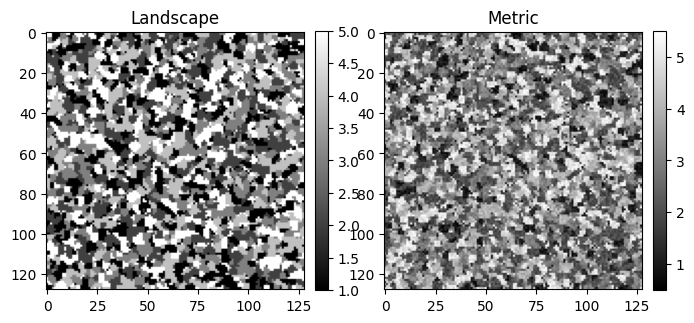

In [108]:
if TEST_MODEL:
    visualize(np.round(test_dataset[3]['landscape'].squeeze()), train_dataset[3]['landscape'][0].squeeze())

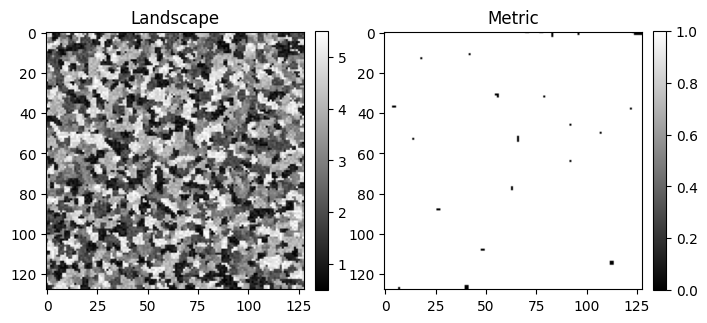

In [105]:
if TEST_MODEL:
    visualize(test_dataset[3]['landscape'].squeeze(), test_dataset[3]['metric'][0].squeeze())

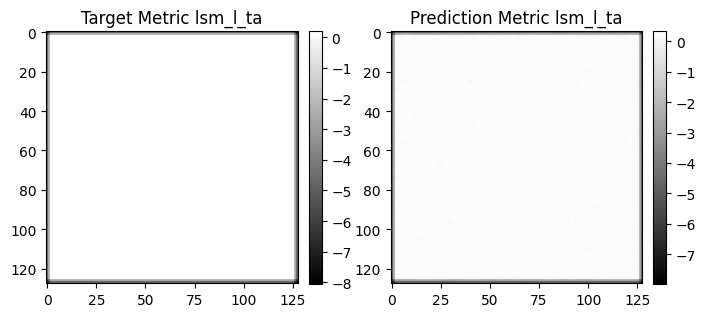

In [66]:
if TEST_MODEL:
    test_metric_num = 54
    test_metri_chn = 199
    #visualize(predicted_metric[2],predicted_metric[2])
    visualize(test_dataset[test_metri_chn]['metric'][test_metric_num].squeeze(),
              predicted_metric[test_metri_chn][test_metric_num].squeeze(), 
              left_title= f"Target Metric {metr_norm[test_metric_num][1]}", 
              right_title = f"Prediction Metric {metr_norm[test_metric_num][1]}")

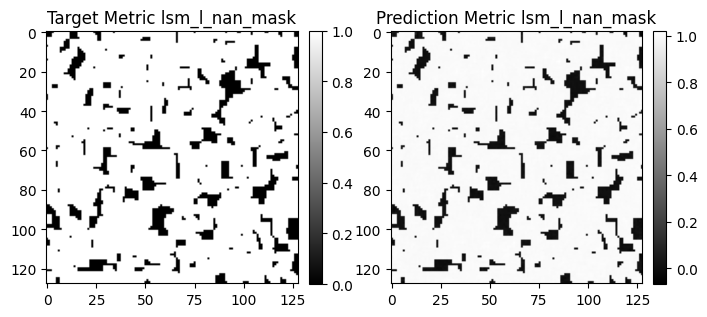

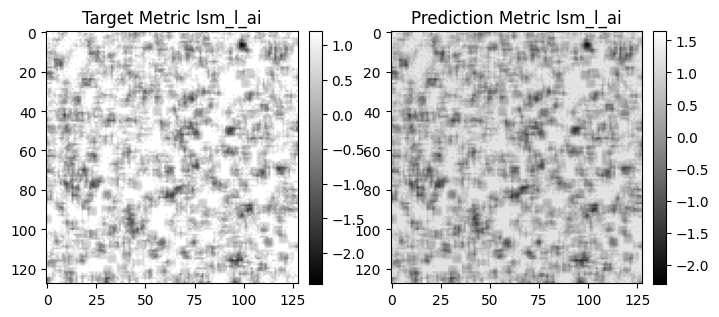

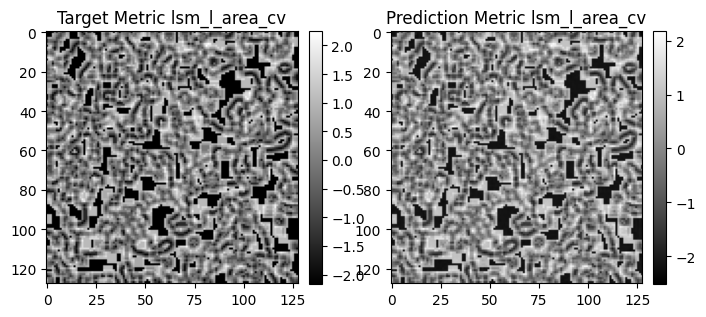

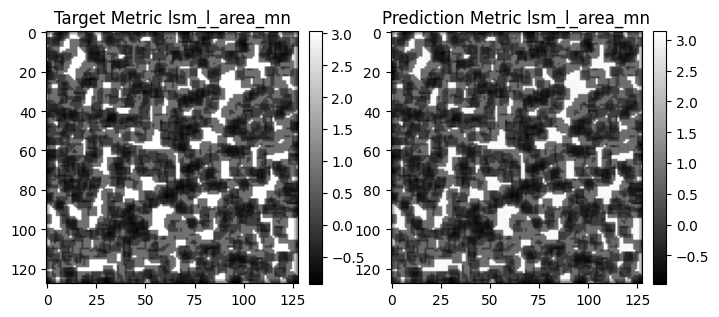

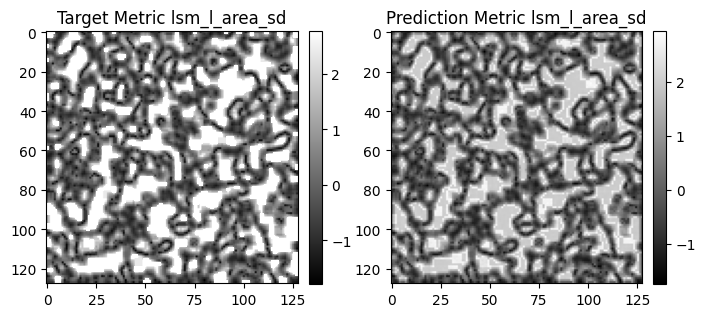

...

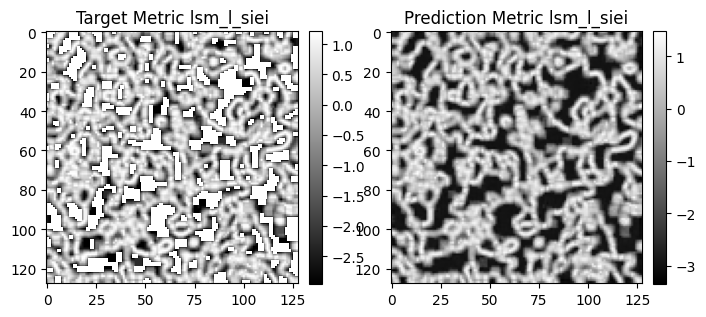

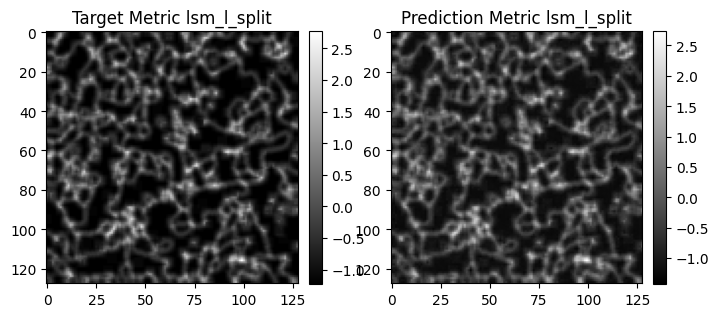

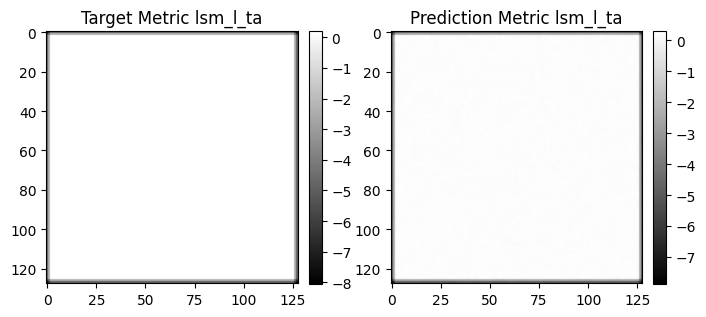

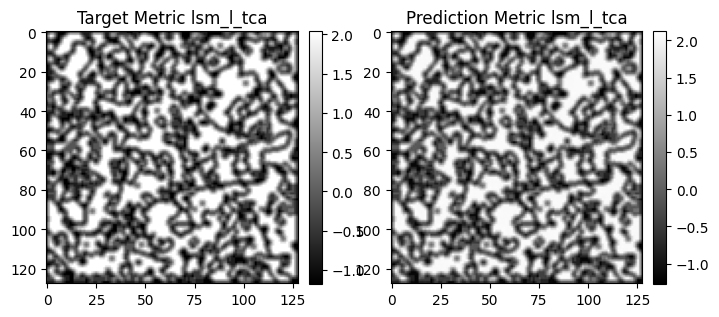

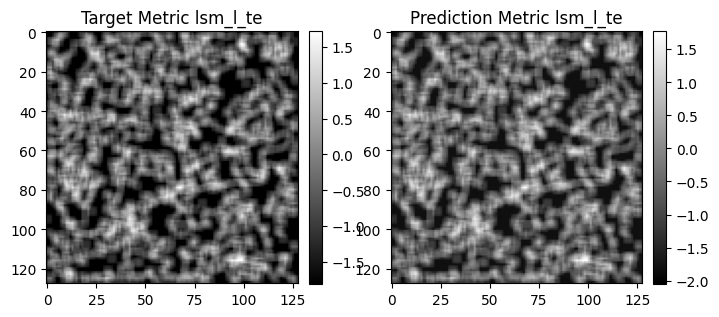

IndexError: index 57 is out of bounds for dimension 0 with size 57

In [88]:
if TEST_MODEL:
    for i in range(0,60):
        test_metric_num = i
        #visualize(predicted_metric[2],predicted_metric[2])
        visualize(test_dataset[10]['metric'][test_metric_num].squeeze(),
                  predicted_metric[10][test_metric_num].squeeze(), 
                  left_title= f"Target Metric {metr_norm[test_metric_num][1]}", 
                  right_title = f"Prediction Metric {metr_norm[test_metric_num][1]}")

### Evaluating only single metrics

In [69]:
TEST_MODEL_SINGLE = True

In [70]:
# Calculate R2 score for every metric for the full test dataset
if TEST_MODEL_SINGLE:

    if EVAL_FN == 'MSE':
        eval_metric = MeanSquaredError()

    elif EVAL_FN == 'R2':
        eval_metric = R2Score()

    def evaluate_test(val_loader, model, device='cuda', criterion=eval_metric, channel=None):
        """Computes the validation accuracy of the model on the validation set."""
        model = model.to(device)
        model.eval() 
        tk0 = tqdm(val_loader, total=len(val_loader))

        with torch.no_grad():
            for b_idx, data in enumerate(tk0):
                for key, value in data.items():
                    data[key] = value.to(device)
                
                #print(data['landscape'].shape)
                out   = model(data['landscape'])  

                # chatgpt suggest flaten:
                targets = data['metric']     
                
                # IF only calculating for specific channels
                if channel or channel == 0: 
                    out = out[:, channel, :, :]                    
                    targets = targets[:, channel, :, :]
                                        
                # Masking NaNs
                nan_mask = torch.isnan(targets)
                valid_mask = ~nan_mask
                targets = targets[valid_mask]
                out = out[valid_mask]
                
                # Flatten and calculate evaluation score
                targets_flat = targets.view(targets.shape[0], -1).cpu()
                outputs_flat = out.view(out.shape[0], -1).cpu()
                criterion.update(outputs_flat, targets_flat)#.cpu()            
                val_loss = criterion.compute().item()            
                tk0.set_postfix(val_score=val_loss)  

            criterion.reset()    

        return val_loss

In [71]:
NUM_METRICS

57

In [72]:
single_test_scores = []
for metric_channel in range(46, NUM_METRICS):
    test_score_single = evaluate_test(test_dataloader, model, criterion=eval_metric, channel=metric_channel)
    single_test_scores.append(test_score_single)
#print(single_test_scores)

 79%|███████▊  | 246/313 [01:03<00:17,  3.85it/s, val_score=1]


KeyboardInterrupt: 

In [111]:
import csv

val_scores_file ='outputs/saved_models/100k_5cl_multi_metrics_66_adjusted/val_scores.csv'
with open(val_scores_file, 'w', newline='') as f:
     
    # using csv.writer method from CSV package
    write = csv.writer(f)
     
    for element in single_test_scores:
        write.writerow([element])
    #write.writerows(rows)

In [110]:
%run LMUnet_r2_one_by_one.py

In [120]:
r2_one_by_one(test_dataset[0]['metric'], torch.from_numpy(predicted_metric[0]))

([0.9842186570167542,
  0.8698663711547852,
  0.9516599178314209,
  0.9814858436584473,
  0.9762917160987854,
  0.9180427193641663,
  0.9865761399269104,
  0.9711560010910034,
  0.5916582345962524,
  0.8588889241218567,
  0.6481948494911194,
  0.973848283290863,
  0.9881768822669983,
  0.9574795961380005,
  0.9133044481277466,
  0.9908300638198853,
  0.987483024597168,
  0.9254905581474304,
  0.9252734184265137,
  0.9631876945495605,
  0.9015005826950073,
  0.9922538995742798,
  0.9892849326133728,
  0.9903889298439026,
  0.8820171356201172,
  0.6879589557647705,
  0.6400625705718994,
  0.9906246066093445,
  0.9821516871452332,
  0.9896126389503479,
  0.9927175045013428,
  0.9903416037559509,
  0.9641547203063965,
  0.9554389715194702,
  0.9289067983627319,
  0.953458845615387,
  'nan',
  0.9029368162155151,
  0.9370129108428955,
  0.8919665813446045,
  0.9526960849761963,
  0.9891337156295776,
  0.9396266937255859,
  0.9391688704490662,
  0.9661462306976318,
  'nan',
  0.8987908363342